# Save the Factory: Feature Engineering Challenge

<img src="https://drive.google.com/uc?id=1QjV8Th9fOK89MhgV-Y1Irn7dTl7ZheP0" width="650">

## Background

In the whimsical town of Widgetville, the mighty Widget Corp stands as the centerpiece, crafting widgets of unmatched quality with a **Ruby** and **Sapphire** magic stones inside. But recently, a trickster sprite seems to have infiltrated the assembly lines, introducing problems and faults to widgets's working procedure and labels. As the company’s freshly appointed Chief Engineering Detective, you are tasked with a mission to unravel this puzzling situation.

## Task

- Your ultimate goal is to effectively classify widgets into two classes: **Ruby** and **Sapphire**.

- You have recovered the labels for a previous month's supply of widgets, and should use these to classify the remaining widgets.

- For every widget, you have an access to the so-called "The Pulse of the Machine" -- a unique numerical representation of each widget, which features 8 magic threads (represented by 187 numbers) woven into the central timeless crystal.
Therefore, each widget is described by (187 x 8) array. You must use these data to recover the **Ruby** and **Sapphire** labels.

- You need to engineer discerning features from the **Pulse of the Machine**, since efficient factory procedures allow you to **only use Decision Tree Classifier** with a limited tree depth as a model, with no hyperparameters change allowed.
  - You can read more about Decision Trees in scikit-learn documentation:
    - https://en.wikipedia.org/wiki/Decision_tree
    - https://scikit-learn.org/stable/modules/tree.html
    - https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html
  
- You have two levels of difficulty, producing **Efficient** and **Super Duper Efficient** solutions. These vary by the allowed tree depth.

- Your classification success will be measured by the ROC AUC metric
  - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html

- Your solution for each task should not exceed 3 minutes for training from scratch and 1 minute for inference on the test set on the standard Colab non-GPU instance. This includes features generation.

## Deliverables

- We will share the test data 48 hours before the deadline

- Use test data to create `efficient_test_predictions.txt` and `super_duper_efficient_test_predictions.txt` and share these files with us

- Also share this notebook containing your solution so we can reproduce your results and check the time constraints

## Tips
- Aim to create a minimal yet mighty set of derivative features to maintain the elegance and effectiveness of your tools.
- The crystals are indeed **timeless** -- be aware that there are no time series involved.
- There was a rumor that not only labels, but the data itself was corrupted by evil spirits. Is there a way for a possible recovery?
- Ensure your solutions are as clear as the crystal waters of Widgetville’s famed springs by providing them with sufficient documentation.

# Below goes data loading and visualization

In [ ]:
import pandas as pd
import numpy as np

np.random.seed(2024)
import matplotlib.pyplot as plt

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score

In [ ]:
!gdown 1eIrRyAqckN6zCjPb9VS-2rw7Bup7YhsA

Downloading...
From (original): https://drive.google.com/uc?id=1eIrRyAqckN6zCjPb9VS-2rw7Bup7YhsA
From (redirected): https://drive.google.com/uc?id=1eIrRyAqckN6zCjPb9VS-2rw7Bup7YhsA&confirm=t&uuid=83ea1f57-6a32-4e71-abab-0b2a3ed57834
To: /content/FE_hometask_data_v3.pickle
100% 260M/260M [00:02<00:00, 108MB/s]


In [ ]:
data = pd.read_pickle('FE_hometask_data_v3.pickle')
for key in data.keys():
  print(key)

train
val


In [ ]:
X_train = np.array([x[0] for x in data['train'].values()])
y_train = np.array([x[1] for x in data['train'].values()])

X_val = np.array([x[0] for x in data['val'].values()])
y_val = np.array([x[1] for x in data['val'].values()])
# this is temporary as we'll share the test data later
X_test = X_val

In [ ]:
X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape

((20240, 187, 8), (20240,), (1456, 187, 8), (1456,), (1456, 187, 8))

In [ ]:
def vis(arr, color='r'):
  widget_type = 'Ruby' if color == 'r' else 'Sapphire'
  plt.figure(figsize=(12, 8))
  for cnt in range(8):
    plt.plot(arr[:, cnt], color=color, alpha=.2 + .1*cnt)
  plt.grid()
  plt.title(f'Pulse of the Machine for {widget_type}')

In [ ]:
y_train[0], y_train[2]

(True, False)

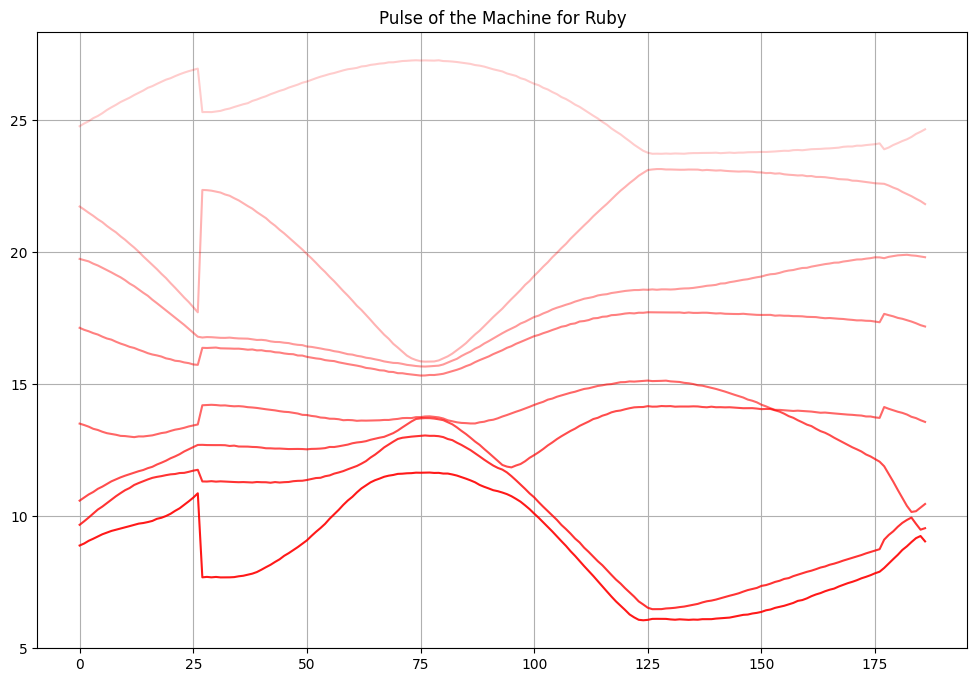

In [ ]:
vis(X_train[0], 'r')

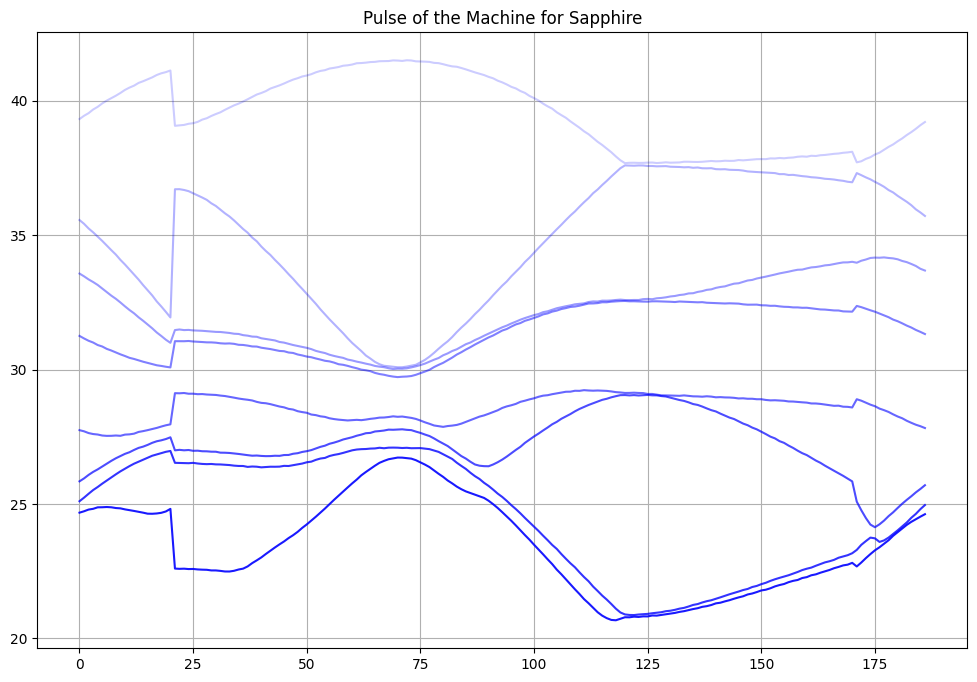

In [ ]:
vis(X_train[4], 'b')

# Functions to evaluate the results
N.B. Do not change it!

In [ ]:
# def efficient_eval(train_features, val_features):
#  model = DecisionTreeClassifier(max_depth=20, random_state=2024).fit(train_features, y_train)
#  preds = model.predict(val_features)
#  return roc_auc_score(y_val, preds)

def efficient_eval(train_features, val_features):
  model = DecisionTreeClassifier(max_depth=20, random_state=2024).fit(train_features, y_train)
  preds = model.predict(val_features)
  return roc_auc_score(y_val, preds)

def efficient_eval_print_incorrect(train_features, test_features):
    model = DecisionTreeClassifier(max_depth=20, random_state=2024).fit(train_features, y_train)
    predictions = model.predict(test_features)
    accuracy = np.mean(predictions == y_val)

    # Identify the incorrect predictions
    incorrect_indices = np.where(predictions != y_val)[0]
    incorrect_data = test_features[incorrect_indices]

    print(f'Accuracy: {accuracy * 100:.2f}%')
    print(f'Number of incorrect predictions: {len(incorrect_indices)}')

    # Plot the incorrect data points
    for i, idx in enumerate(incorrect_indices):
        plt.figure()
        plt.plot(X_val[idx], label='Original Data')
        plt.title(f'Incorrect Prediction - Index: {idx}, Predicted: {predictions[idx]}, Actual: {y_val[idx]}')
        plt.xlabel('Time')
        plt.ylabel('Pulse Value')
        plt.legend()
        plt.show()

    return accuracy

def super_duper_efficient_eval(train_features, val_features):
  model = DecisionTreeClassifier(max_depth=4, random_state=2024).fit(train_features, y_train)
  preds = model.predict(val_features)
  return roc_auc_score(y_val, preds)

# Functions to write answers to files

Don't change the functions, share the files with us in your final submission.

In [ ]:
def efficient_test_predictions(train_features, test_features):
  model = DecisionTreeClassifier(max_depth=20, random_state=2024).fit(train_features, y_train)
  preds = ['1' if x else '0'
           for x in model.predict(test_features)]
  with open('efficient_test_predictions.txt', 'w') as f:
    f.write(''.join(preds))

def super_duper_efficient_test_predictions(train_features, test_features):
  model = DecisionTreeClassifier(max_depth=4, random_state=2024).fit(train_features, y_train)
  preds = ['1' if x else '0'
           for x in model.predict(test_features)]
  with open('super_duper_efficient_test_predictions.txt', 'w') as f:
    f.write(''.join(preds))

# Baselines: let's try some simple feature sets!
- every 10th element of a flattened array
- mean value / standard deviation by each axis

In [ ]:
def feature_set_10th(X):
  return np.reshape(X, (X.shape[0], -1))[:, ::10]

def feature_set_mean(X, axis=1):
  return np.mean(X, axis=axis)

def feature_set_std(X, axis=1):
  return np.std(X, axis=axis)

In [ ]:
%%time
efficient_eval(
    feature_set_10th(X_train),
    feature_set_10th(X_val)
)

NameError: name 'efficient_eval' is not defined

In [ ]:
%%time
super_duper_efficient_eval(
    feature_set_10th(X_train),
    feature_set_10th(X_val)
)

NameError: name 'super_duper_efficient_eval' is not defined

In [ ]:
%%time
efficient_eval(
    feature_set_mean(X_train, axis=2),
    feature_set_mean(X_val, axis=2)
)

NameError: name 'efficient_eval' is not defined

In [ ]:
%%time
efficient_eval(
    feature_set_std(X_train, axis=2),
    feature_set_std(X_val, axis=2)
)

NameError: name 'efficient_eval' is not defined

In [ ]:
%%time
super_duper_efficient_eval(
    feature_set_std(X_train, axis=2),
    feature_set_std(X_val, axis=2)
)

Ok, for some reason `feature_set_std, axis=2` was the best.

That's how one produces results for the test set.
Don't forget to share the files with us!

In [ ]:
efficient_test_predictions(
    feature_set_std(X_train, axis=2),
    feature_set_std(X_test, axis=2)
)

NameError: name 'efficient_test_predictions' is not defined

In [ ]:
super_duper_efficient_test_predictions(
    feature_set_std(X_train, axis=2),
    feature_set_std(X_test, axis=2)
)

# Now it's your turn to try!

Streaming output truncated to the last 5000 lines.
<ipython-input-139-57c411da206c>:19: RankWarning: Polyfit may be poorly conditioned
  p = np.polyfit(x_range, y_range, n)
<ipython-input-139-57c411da206c>:19: RankWarning: Polyfit may be poorly conditioned
  p = np.polyfit(x_range, y_range, n)
<ipython-input-139-57c411da206c>:19: RankWarning: Polyfit may be poorly conditioned
  p = np.polyfit(x_range, y_range, n)
<ipython-input-139-57c411da206c>:19: RankWarning: Polyfit may be poorly conditioned
  p = np.polyfit(x_range, y_range, n)
<ipython-input-139-57c411da206c>:19: RankWarning: Polyfit may be poorly conditioned
  p = np.polyfit(x_range, y_range, n)
<ipython-input-139-57c411da206c>:19: RankWarning: Polyfit may be poorly conditioned
  p = np.polyfit(x_range, y_range, n)
<ipython-input-139-57c411da206c>:19: RankWarning: Polyfit may be poorly conditioned
  p = np.polyfit(x_range, y_range, n)
<ipython-input-139-57c411da206c>:19: RankWarning: Polyfit may be poorly conditioned
  p = np.po

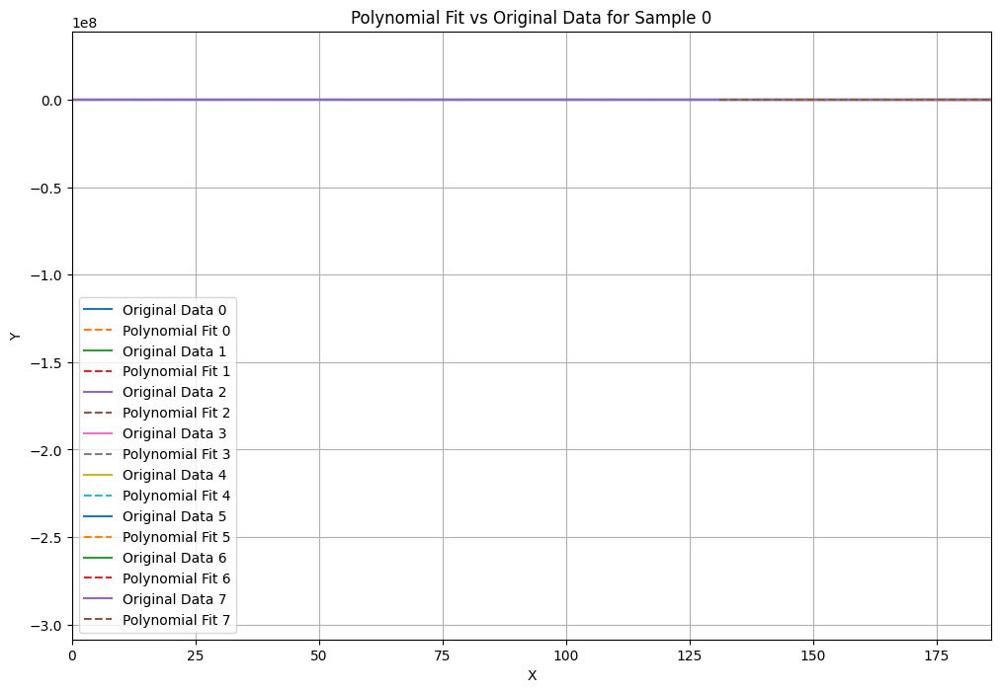

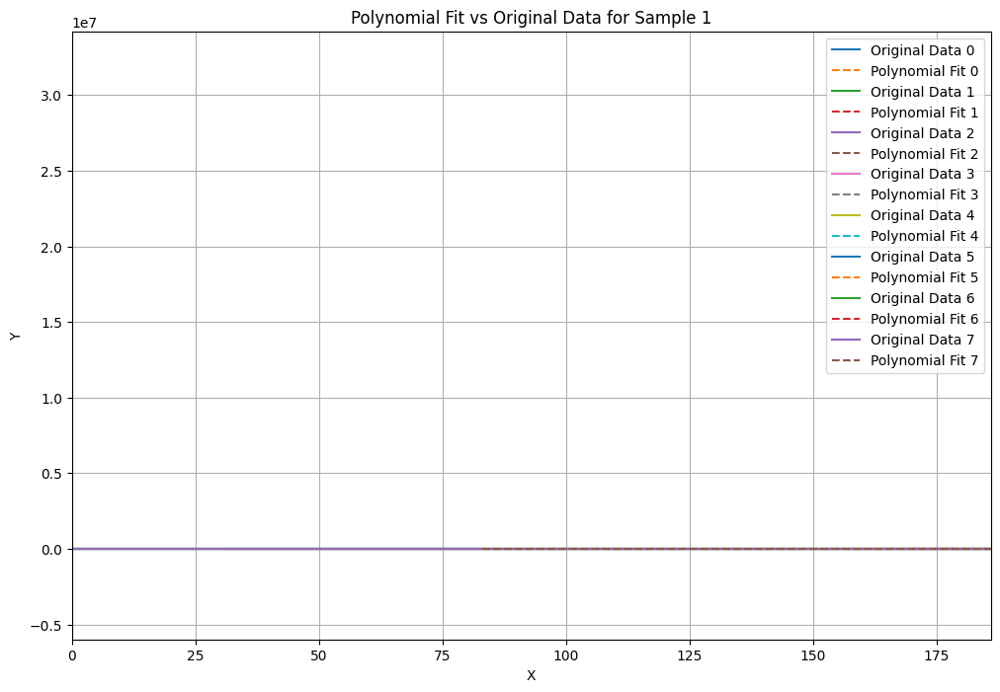

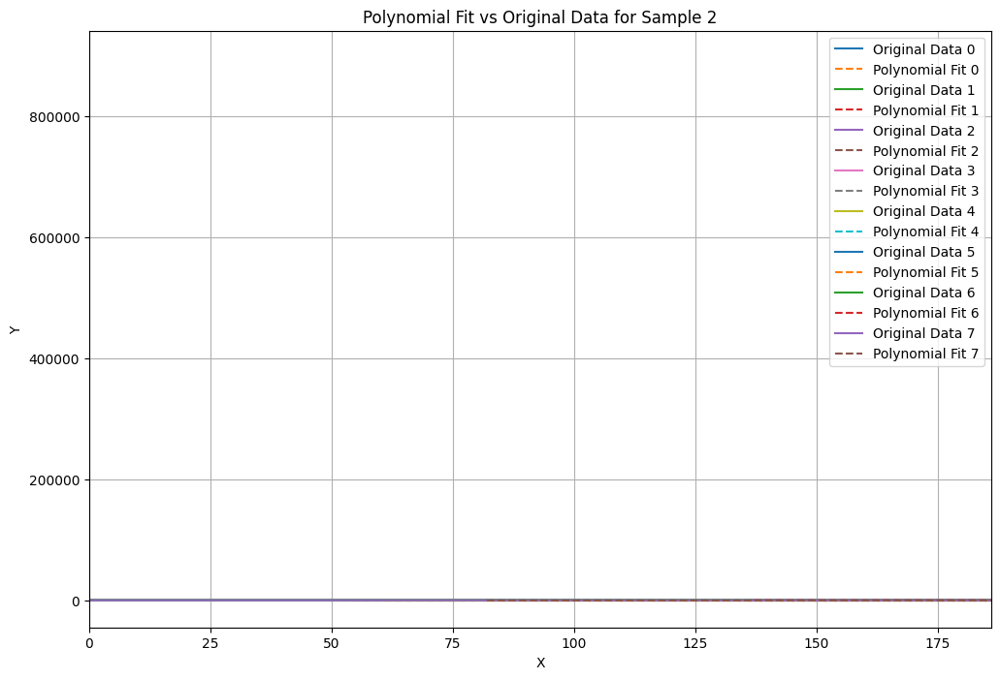

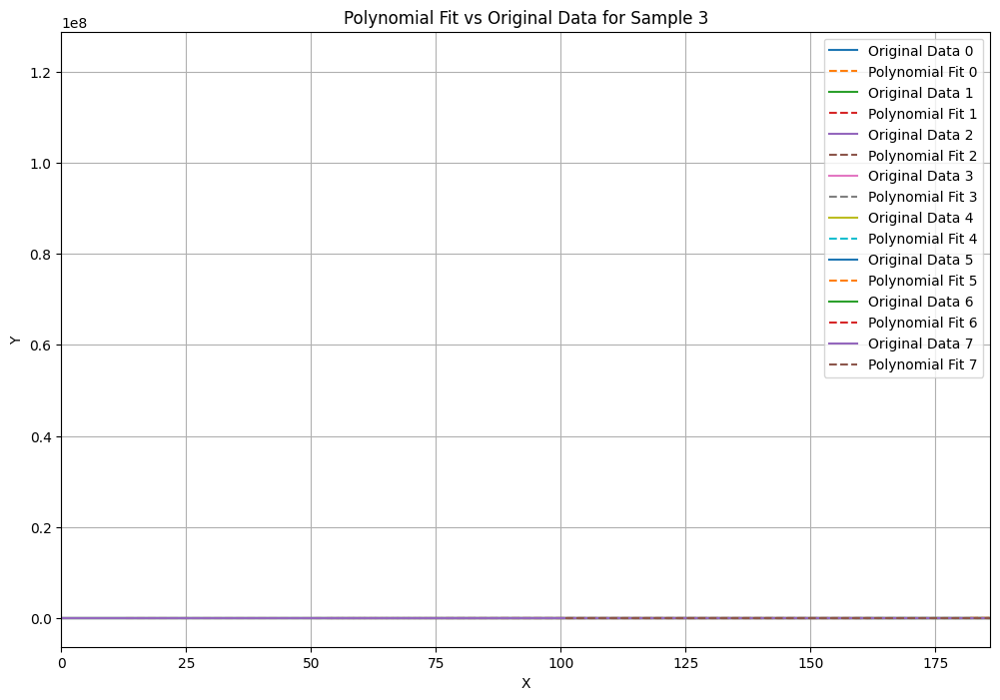

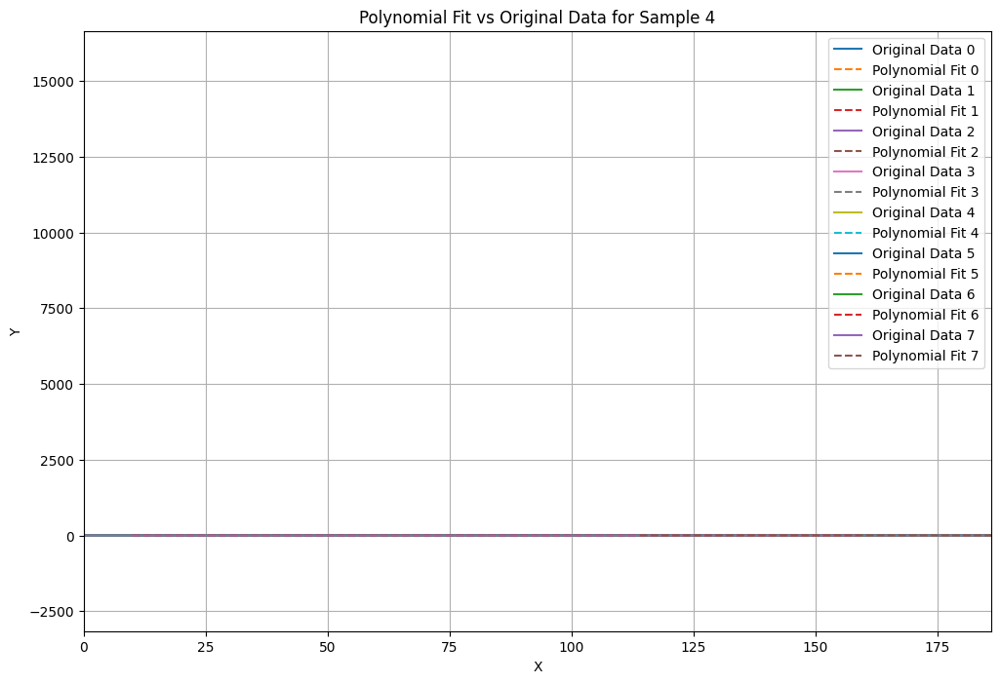

...

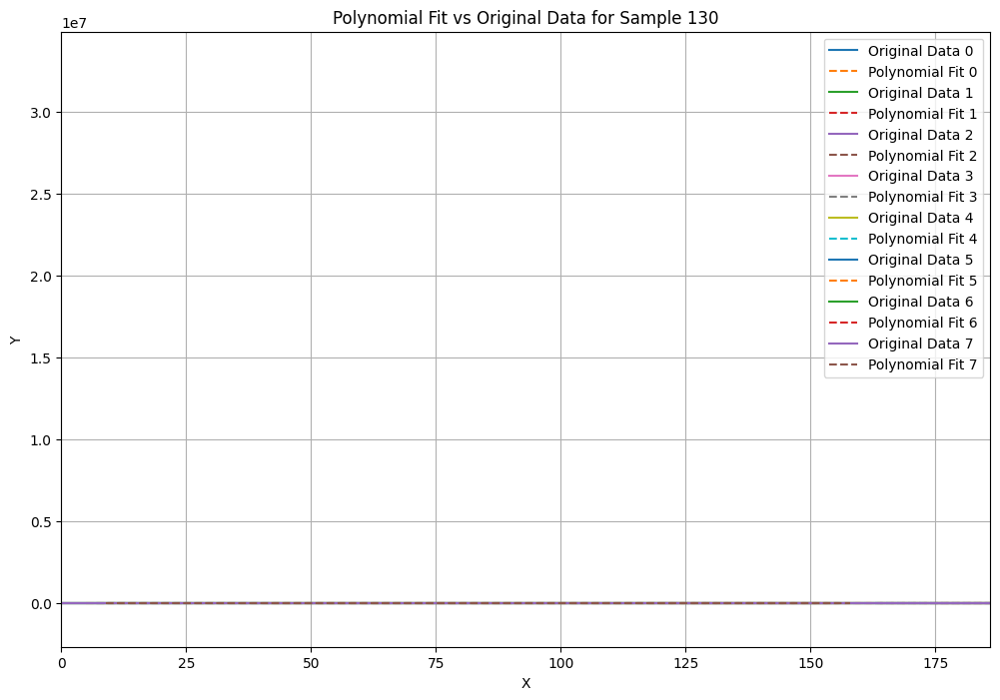

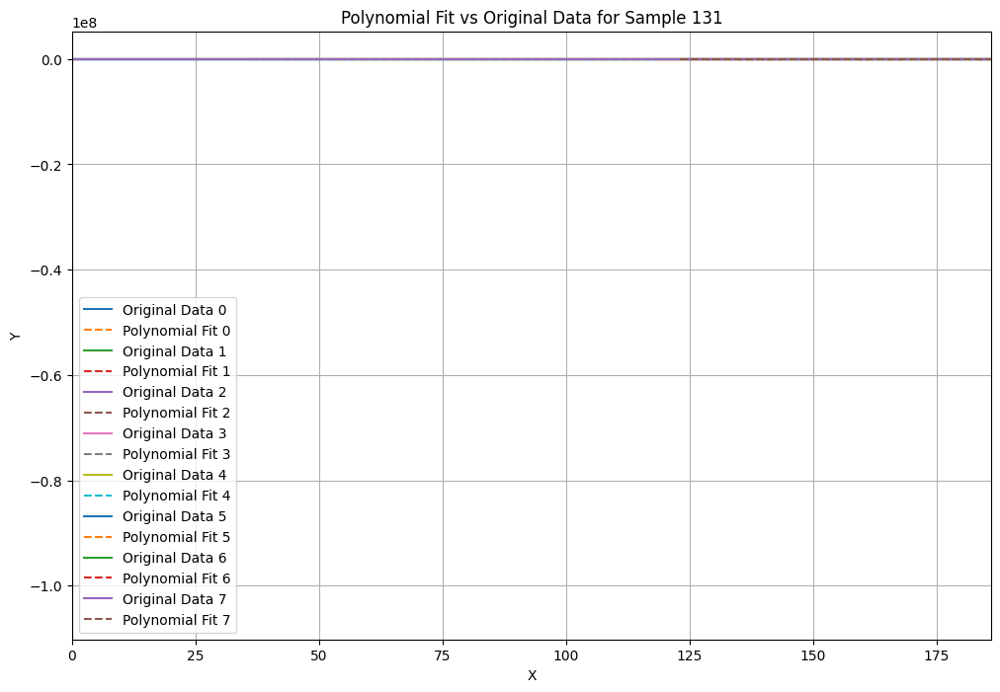

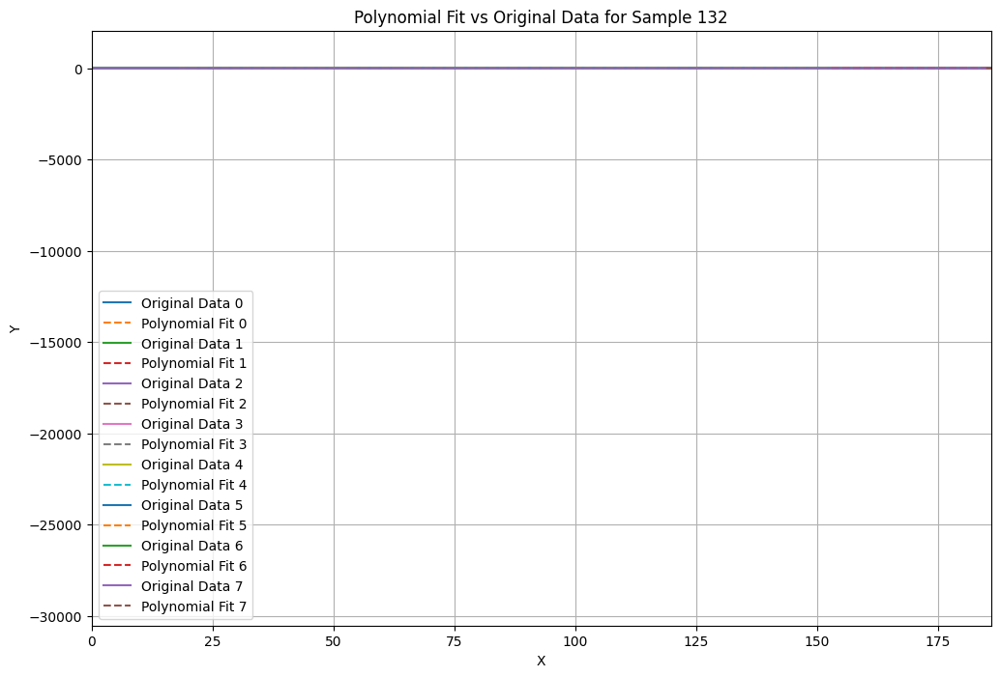

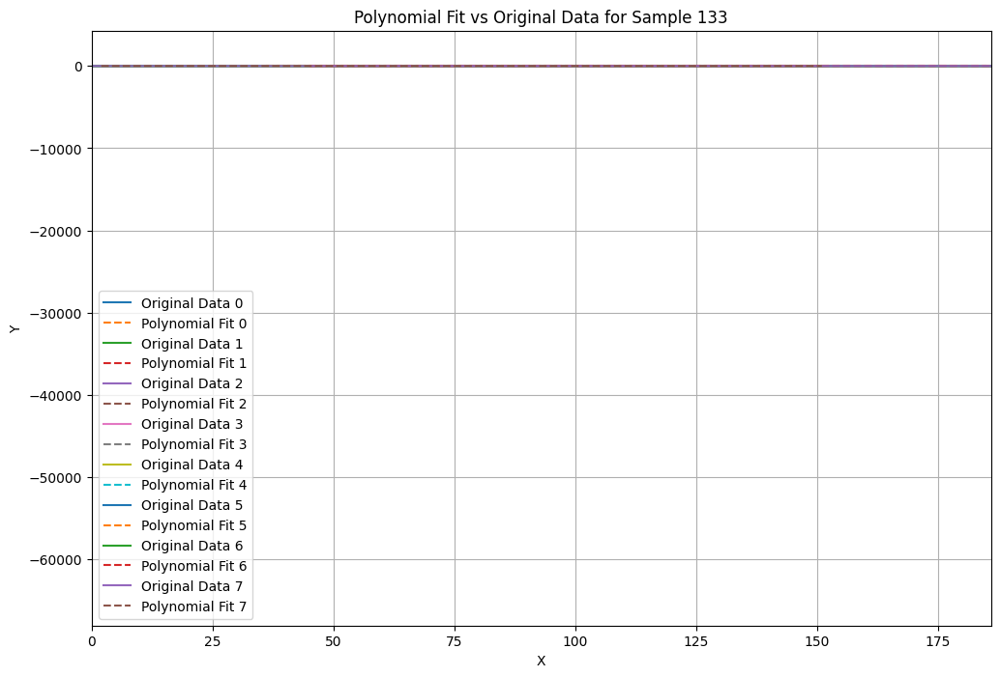

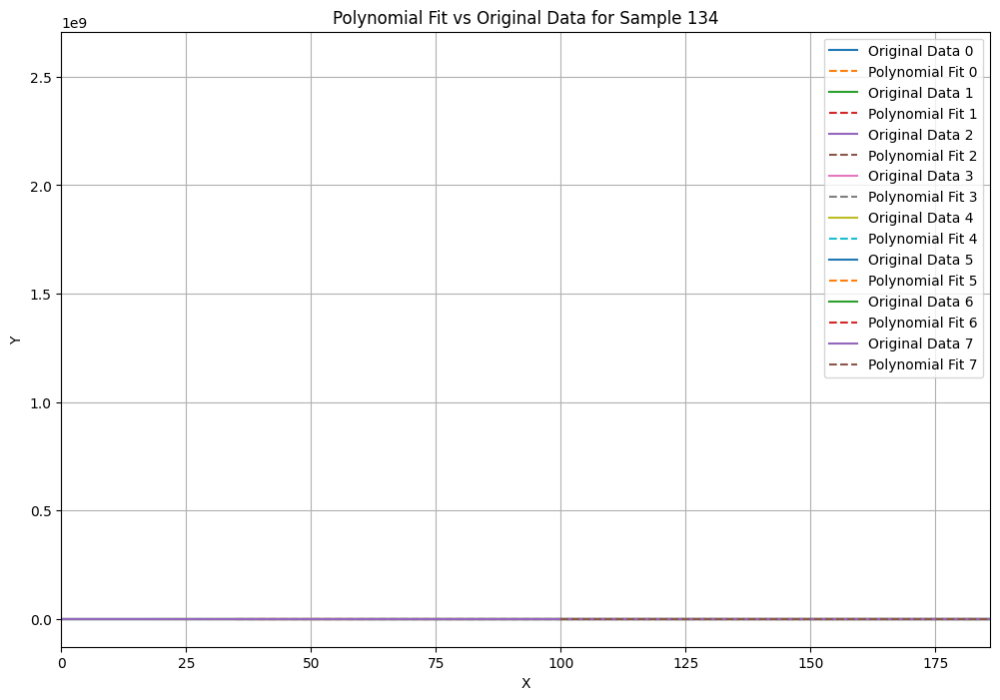

KeyboardInterrupt: 

In [ ]:
#Polynomial vs actual data correlation (measures choppiness)

import numpy as np

def fit_poly(data, n=5):
    shape = data.shape
    coeff = np.zeros((shape[0], n + 1, 8))
    for j in range(shape[0]):
        for i in range(8):
            x = np.linspace(0, 187, 187)
            y = data[j][:, i].astype(np.float64)
            p = np.polyfit(x, y, n)
            coeff[j, :, i] = p
    return coeff

def predict_poly(coeff, n=5):
    shape = coeff.shape
    x = np.linspace(0, 187, 187)
    predicted_data = np.zeros((shape[0], 187, 8))
    for j in range(shape[0]):
        for i in range(8):
            p = coeff[j, :, i]
            y_pred = np.polyval(p, x)
            predicted_data[j, :, i] = y_pred
    return predicted_data

def calculate_correlation(data, predicted_data):
    correlations = []
    for j in range(data.shape[0]):
        corr_per_sample = []
        for i in range(8):
            x = data[j][:, i]
            y = predicted_data[j][:, i]
            corr = np.corrcoef(x, y)[0, 1]
            corr_per_sample.append(corr)
        correlations.append(corr_per_sample)
    return np.array(correlations)

# Example usage:
# Assuming X_train_cleaned is your input data with shape (number_of_samples, 187, 8)
coefficients = fit_poly(X_train, n=5)

print(coefficients)
print(coefficients.shape)
predicted = predict_poly(coefficients, n=5)
correlations = calculate_correlation(X_train, predicted)

# Print the average correlation per feature
avg_correlation_per_feature = correlations.mean(axis=0)
print("Average Correlation per Feature:", avg_correlation_per_feature)

# Print the overall average correlation
overall_avg_correlation = correlations.mean()
print("Overall Average Correlation:", overall_avg_correlation)


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt


# def fit_polynomials(data, A, B, n=5):
#     shape = data.shape
#     coeffs = np.zeros((shape[0], shape[2], n + 1))  # Shape [20240, 8, 6]

#     for j in range(shape[0]):
#         x = np.linspace(0, shape[1] - 1, shape[1])
#         for i in range(shape[2]):
#             start_index = A[j, i]
#             end_index = B[j, i]

#             # Ensure indices are within bounds
#             if start_index >= end_index or start_index < 0 or end_index >= len(x):
#                 print(f"Skipping invalid range for sample {j}, dimension {i}: start_index={start_index}, end_index={end_index}")
#                 continue

#             # Select the range from A to B
#             x_range = x[start_index:end_index + 1]
#             y_range = data[j, start_index:end_index + 1, i].astype(np.float64)

#             # Fit the polynomial within the bounds
#             if len(x_range) > 1 and len(y_range) > 1:
#                 p = np.polyfit(x_range, y_range, n)
#                 coeffs[j, i, :] = p
#             else:
#                 print(f"Not enough data points for fitting polynomial for sample {j}, dimension {i}")

#     return coeffs

# def visualize_polynomial_comparison(data, coeffs, A, B, n=5):
#     num_samples = data.shape[0]
#     x = np.linspace(0, 186, 187)  # X-axis for the original data points

#     for j in range(num_samples):
#         plt.figure(figsize=(12, 8))
#         for i in range(data.shape[2]):
#             # Plot original data
#             plt.plot(x, data[j, :, i], label=f'Original Data {i}')

#             # Generate polynomial curve
#             start_index = A[j, i]
#             end_index = B[j, i]
#             if start_index >= end_index or start_index < 0 or end_index >= len(x):
#                 continue
#             x_range = np.linspace(start_index, end_index, 100)
#             poly_y = np.polyval(coeffs[j, i, :], x_range)

#             # Plot polynomial fit
#             plt.plot(x_range, poly_y, linestyle='--', label=f'Polynomial Fit {i}')

#         plt.legend()
#         plt.title(f'Polynomial Fit vs Original Data for Sample {j}')
#         plt.xlabel('X')
#         plt.ylabel('Y')
#         plt.grid(True)
#         plt.xlim([0, 186])  # Ensure the x-axis is within the full range
#         plt.show()








# # Assume X_train is already defined with the appropriate data
# A = find_max_derivative_index(X_train)
# B = A + 149

# coeff = fit_polynomials(X_train, A, B, n=5)

# print(coeff)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def find_max_derivative_index(data):
    max_derivative_indices = np.zeros((data.shape[0], data.shape[2]), dtype=int)

    for i in range(37):
        for j in range(data.shape[2]):
            derivative = np.abs(np.diff(data[i, :, j]))
            max_derivative_indices[i, j] = np.argmax(derivative)

    return max_derivative_indices

def fit_polynomials(data, A, B, n=5):
    shape = data.shape
    coeffs = [np.zeros((shape[0], shape[2])) for _ in range(n + 1)]  # List of 6 arrays [20240, 8]

    for j in range(shape[0]):
        x = np.linspace(0, shape[1] - 1, shape[1])
        for i in range(shape[2]):
            start_index = A[j, i]
            end_index = B[j, i]

            # Ensure indices are within bounds
            if start_index >= end_index or start_index < 0 or end_index >= len(x):
                print(f"Skipping invalid range for sample {j}, dimension {i}: start_index={start_index}, end_index={end_index}")
                continue

            # Select the range from A to B
            x_range = x[start_index:end_index + 1]
            y_range = data[j, start_index:end_index + 1, i].astype(np.float64)

            # Fit the polynomial within the bounds
            if len(x_range) > 1 and len(y_range) > 1:
                p = np.polyfit(x_range, y_range, n)
                for k in range(n + 1):
                    coeffs[k][j, i] = p[k]
            else:
                print(f"Not enough data points for fitting polynomial for sample {j}, dimension {i}")

    return coeffs




In [ ]:
# Normalize EACH DATASET separately

def normalize_datasets(data):
    normalized = data.copy()
    shape = data.shape
    for i in range(shape[0]):
        d_max, d_min = np.max(normalized[i]), np.min(normalized[i])
        d_range = d_max - d_min
        for x in range(shape[1]):
            for y in range(shape[2]):
                normalized[i, x, y] = (normalized[i, x, y] - d_min) / d_range
    return normalized

In [ ]:

#93.08%



from scipy import stats
import scipy.fftpack
import random

def feature_set_alter(data):
    data = normalize_datasets(data)

    std = np.std(data, axis=1)

    skewness = 3 * (np.mean(data, axis=1) - np.median(data, axis=1)) / std

    first_diff = np.diff(std)

    features_to_insert = [

        std,
        first_diff,
        np.diff(first_diff),
        skewness,
        np.max(data, axis=1),
        stats.kurtosis(data, axis=1),
        stats.moment(data, 2, axis=1),
        stats.moment(data, 3, axis=1),
        stats.moment(data, 4, axis=1),
        stats.moment(data, 6, axis=1),
        stats.moment(data, 7, axis=1),
        stats.moment(data, 9, axis=1),
        stats.moment(data, 10, axis=1),


    ]

    altered_data = np.ndarray((data.shape[0], sum([v.shape[1] for v in features_to_insert])))

    last_index = 0
    for values in features_to_insert:
        next_index = last_index + values.shape[1]
        altered_data[:, last_index : next_index] = values
        last_index = next_index

    return altered_data

train_data = feature_set_alter(X_train)
test_data = feature_set_alter(X_val)

accuracy = efficient_eval(train_data, test_data)

print(accuracy)

0.9307711246895511


In [ ]:
#91.96%

from scipy import stats
import scipy.fftpack
import random
import numpy as np



def feature_set_alter(data):
    data = normalize_datasets(data)



    std = np.std(data, axis=1)
    skewness = 3 * (np.mean(data, axis=1) - np.median(data, axis=1)) / std
    dx = np.diff(data,axis=1)
    ddx = np.diff(dx,axis=1)
    activity = np.var(data,axis=1)
    var_dx = np.var(dx,axis=1)
    var_ddx = np.var(ddx,axis=1)
    mobility = np.sqrt(var_dx / activity)
    complexity = np.sqrt(var_ddx / var_dx) / mobility

    features_to_insert = [
        activity,
        mobility,
        complexity,
        skewness,
        np.max(data, axis=1),
        stats.kurtosis(data, axis=1),
        stats.kurtosis(data, axis=1),
        stats.moment(data, 2, axis=1),
        stats.moment(data, 3, axis=1),
        stats.moment(data, 4, axis=1),
        stats.moment(data, 6, axis=1),
        stats.moment(data, 7, axis=1),
        stats.moment(data, 9, axis=1),
        stats.moment(data, 10, axis=1),

    ]

    altered_data = np.ndarray((data.shape[0], sum([v.shape[1] for v in features_to_insert])))

    last_index = 0
    for values in features_to_insert:
        next_index = last_index + values.shape[1]
        altered_data[:, last_index : next_index] = values
        last_index = next_index

    return altered_data

train_data = feature_set_alter(X_train)
test_data = feature_set_alter(X_val)

accuracy = efficient_eval(train_data, test_data)

print(accuracy)

0.9158578549668889


In [ ]:
#67.


from scipy import stats
import scipy.fftpack
import random
import numpy as np



def feature_set_alter(data):
    data = normalize_datasets(data)
    A = find_max_derivative_index(data)
    B = A + 149
    coeff = fit_polynomials(data, A, B, n=5)
    features_to_insert = [
      coeff[0],
      coeff[1],
      coeff[2],
      coeff[3],
      coeff[4],
      coeff[5],

    ]

    altered_data = np.ndarray((data.shape[0], sum([v.shape[1] for v in features_to_insert])))

    last_index = 0
    for values in features_to_insert:
        next_index = last_index + values.shape[1]
        altered_data[:, last_index : next_index] = values
        last_index = next_index

    return altered_data

train_data = feature_set_alter(X_train)
test_data = feature_set_alter(X_val)

accuracy = efficient_eval(train_data, test_data)

print(accuracy)

Skipping invalid range for sample 0, dimension 5: start_index=179, end_index=328
Skipping invalid range for sample 1, dimension 3: start_index=184, end_index=333
Skipping invalid range for sample 1, dimension 4: start_index=184, end_index=333
Skipping invalid range for sample 1, dimension 5: start_index=184, end_index=333
Skipping invalid range for sample 2, dimension 3: start_index=161, end_index=310
Skipping invalid range for sample 2, dimension 5: start_index=161, end_index=310
Skipping invalid range for sample 2, dimension 6: start_index=161, end_index=310
Skipping invalid range for sample 3, dimension 5: start_index=182, end_index=331
Skipping invalid range for sample 3, dimension 6: start_index=182, end_index=331
Skipping invalid range for sample 4, dimension 5: start_index=170, end_index=319
Skipping invalid range for sample 5, dimension 5: start_index=177, end_index=326
Skipping invalid range for sample 6, dimension 5: start_index=164, end_index=313
Skipping invalid range for s